In [57]:
import cv2
import sqlite3
from matplotlib import pyplot as plt
import numpy as np

from visualize_model import Model
from database import blob_to_array, pair_id_to_image_ids

# 1. 3D mesh reconstruction from a set of images from the Gerrard Hall dataset.
Install Colmap and run the automatic reconstruction on the Gerrard Hall dataset

# 2. Analyze reconstructions using python
## 2.1. Run the notebook, using the Gerrard Hall reconstruction (0.5)
#### <span style='color:Green'> - Add the path to your reconstruction. Answer the questions at the end  </span>

In [58]:
# Add your path
reconstruction_path = "C:\\Users\\yeray142\\Desktop\\colmap\\gerrard-hall\\sparse"
database_path = "C:\\Users\\yeray142\\Desktop\\colmap\\gerrard-hall\\database.db"

#### Load an existing reconstruction and print its contents

In [60]:
model = Model()
model.read_model(reconstruction_path, ext='.txt') # Should also work with .txt

In [61]:
images = model.images
cameras = model.cameras
points3D = model.points3D

In [63]:
print(f"Loaded {len(images)} images. This is the information available for one of them:")
print(images[1])
print(f"\nLoaded {len(cameras)} cameras. This is the information available for one of them:")
print(cameras[1])
print(f"\nLoaded {len(points3D)} 3D points. This is the information available for one of them:")
print(points3D[1])

Loaded 100 images. This is the information available for one of them:
Image(id=1, qvec=array([ 0.640157,  0.206439, -0.252259,  0.695664]), tvec=array([-0.720058, -1.96521 ,  2.73524 ]), camera_id=1, name='IMG_2387.JPG', xys=array([[ 758.386 ,   61.3678],
       [2757.87  ,   11.2852],
       [2775.63  ,   33.5677],
       ...,
       [1864.09  , 3612.57  ],
       [2398.21  , 3603.64  ],
       [2398.21  , 3603.64  ]], shape=(12207, 2)), point3D_ids=array([-1, -1, -1, ..., -1, -1, -1], shape=(12207,)))

Loaded 1 cameras. This is the information available for one of them:
Camera(id=1, model='OPENCV', width=5616, height=3744, params=array([ 3.83827e+03,  3.83722e+03,  2.80800e+03,  1.87200e+03,
       -1.10339e-01,  7.95470e-02,  1.16211e-04,  2.94830e-04]))

Loaded 43188 3D points. This is the information available for one of them:
Point3D(id=1, xyz=array([ 1.05663, -1.42799, -1.68133]), rgb=array([199, 197, 190]), error=0.448922, image_ids=array([99, 63, 27, 18, 42, 50, 26, 35, 28,  1

#### Load the database

In [64]:
db = sqlite3.connect(database_path)

In [65]:
keypoints = dict(
        (image_id, blob_to_array(data, np.float32, (-1, 2)))
        for image_id, data in db.execute("SELECT image_id, data FROM keypoints")
    )

In [66]:
print(f"Loaded keypoints from {len(keypoints)} images. These are the {len(keypoints[1])} keypoints for one of them:")
print(keypoints[1])

Loaded keypoints from 100 images. These are the 24414 keypoints for one of them:
[[7.5838574e+02 6.1367775e+01]
 [4.0777049e+00 2.3697526e+00]
 [2.7578696e+03 1.1285216e+01]
 ...
 [4.2930962e+01 4.8993421e+00]
 [2.3982122e+03 3.6036423e+03]
 [4.2930962e+01 2.5109098e+00]]


In [67]:
matches = dict()
count_no_data = 0
for pair_id, data in db.execute("SELECT pair_id, data FROM matches"):
    if data is None:
        count_no_data += 1
    else:
        matches[pair_id_to_image_ids(pair_id)] = blob_to_array(data, np.uint32, (-1, 2))
print(f"Loaded {len(matches)} matches. {count_no_data}/{len(matches)+count_no_data} matches contained no data")

Loaded 2153 matches. 2797/4950 matches contained no data


In [68]:
print("These are the matches between two images:")
print(matches[1,3])

These are the matches between two images:
[[1459   68]
 [8054  481]
 [8113  482]
 [8114  483]
 [8187  484]
 [6590  512]
 [8009  603]
 [8053  608]
 [8184  611]
 [8111  612]
 [8112  613]
 [8052  774]
 [8182  775]
 [8181  777]
 [5326  783]
 [5806  797]
 [8005  903]
 [8107  907]
 [8110  909]
 [8048  910]
 [8049  911]
 [8180  914]
 [8177  915]
 [8175  916]
 [5067  917]
 [8178  919]
 [5800  926]
 [6416  939]
 [8002 1041]
 [8000 1043]
 [8001 1044]
 [8044 1050]
 [5684 1062]
 [7995 1191]
 [8104 1192]
 [8099 1194]
 [8097 1196]
 [8100 1197]
 [8096 1198]
 [8169 1200]
 [8171 1201]
 [6658 1223]
 [8039 1339]
 [8092 1340]
 [8088 1341]
 [8094 1342]
 [8168 1343]
 [6477 1384]
 [7172 1397]
 [7173 1398]
 [7170 1399]
 [7168 1400]
 [7994 1491]
 [7991 1492]
 [7992 1493]
 [8036 1496]
 [7993 1498]
 [8087 1505]
 [5912 1525]
 [7003 1549]
 [7002 1550]
 [7986 1684]
 [8032 1685]
 [8165 1687]
 [8163 1688]
 [6570 1709]
 [6565 1710]
 [7237 1735]
 [8033 1855]
 [8031 1856]
 [8086 1857]
 [8085 1858]
 [8162 1860]
 [5436 18

#### Visualize the point cloud and cameras

In [69]:
model.create_window()
model.add_points()
model.add_cameras(scale=0.25)
model.show()

#### <span style='color:Green'>  How many keypoints there are in total? </span> 

In [70]:
total_keypoints = sum(len(kp) for kp in keypoints.values())
print(f"Total number of keypoints across all images: {total_keypoints}")

Total number of keypoints across all images: 2123400


#### <span style='color:Green'>  How many 3D points originated from a keypoint in the first image? </span>


In [71]:
# Get the first image in images dictionary
key = next(iter(images.keys()))

img = images.get(key)
points3D_from_first = sum(1 for point3D_id in img.point3D_ids if point3D_id != -1)

print(f"Number of 3D points from the first image: {points3D_from_first}")

Number of 3D points from the first image: 3237


## 2.2 Plot the 3D points coloured according to the number of images and error. (0.5)

#### <span style='color:Green'> - Plot the 3D points coloured according to the **number of images** from which it originated. </span> Can you extract any conclusions from the visualization? 

In [72]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np

# Convert the data to the correct format first
point_data = []
for point_id, point in points3D.items():
    point_data.append({
        'x': float(point.xyz[0]),  # Ensure these are regular floats
        'y': float(point.xyz[1]),
        'z': float(point.xyz[2]),
        'n_images': int(len(point.image_ids)),  # Convert to regular int
        'error': float(point.error),  # Convert to regular float
        'point_id': int(point_id)  # Convert to regular int
    })

# Create DataFrame from the processed data
df = pd.DataFrame(point_data)

# Create figure with secondary y-axis
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scene'}, {'type': 'scene'}]],
    subplot_titles=('Number of Images per Point', 'Reprojection Error')
)

# Add traces for number of images
fig.add_trace(
    go.Scatter3d(
        x=df['x'].values,  # Use .values to convert to numpy array
        y=df['y'].values,
        z=df['z'].values,
        mode='markers',
        marker=dict(
            size=2,
            color=df['n_images'].values,  # Use .values here too
            colorscale='Viridis',
            colorbar=dict(title='# Images', x=0.45),
            showscale=True
        ),
        hovertemplate=
        '<b>Point ID</b>: %{text}<br>' +
        '<b>X</b>: %{x:.2f}<br>' +
        '<b>Y</b>: %{y:.2f}<br>' +
        '<b>Z</b>: %{z:.2f}<br>' +
        '<b># Images</b>: %{marker.color}<br>',
        text=df['point_id'].values
    ),
    row=1, col=1
)

# Add traces for error
fig.add_trace(
    go.Scatter3d(
        x=df['x'].values,
        y=df['y'].values,
        z=df['z'].values,
        mode='markers',
        marker=dict(
            size=2,
            color=df['error'].values,
            colorscale='Viridis',
            colorbar=dict(title='Error', x=1),
            showscale=True
        ),
        hovertemplate=
        '<b>Point ID</b>: %{text}<br>' +
        '<b>X</b>: %{x:.2f}<br>' +
        '<b>Y</b>: %{y:.2f}<br>' +
        '<b>Z</b>: %{z:.2f}<br>' +
        '<b>Error</b>: %{marker.color:.3f}<br>',
        text=df['point_id'].values
    ),
    row=1, col=2
)

# Update layout
fig.update_layout(
    title_text="3D Points Visualization",
    showlegend=False,
    width=1400,
    height=700,
)

# Update scenes
for i in [1, 2]:
    fig.update_scenes(
        dict(
            xaxis_title="X",
            yaxis_title="Y",
            zaxis_title="Z",
            aspectmode='data'
        ),
        row=1, col=i
    )

fig.show()

#### <span style='color:Green'> - Plot the 3D points coloured according to the **error**. </span> - What is this parameter? Can you extract any conclusions from the visualization?

In [73]:
### TO DO 2.2

# This is done in the previous code cell.

## 2.3 Plot the 3D points that correspond to a keypoint in the first image. Also plot the image with the keypoints (1.0)


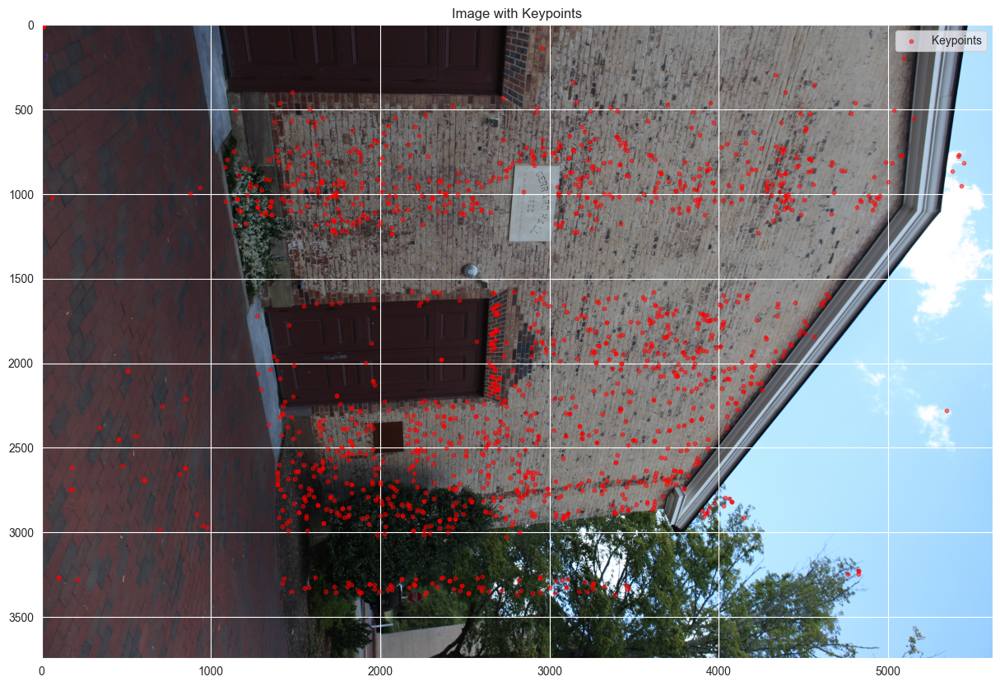

Number of valid keypoints: 2819
Keypoint coordinate ranges:
X: min=3.57, max=5445.26
Y: min=0.00, max=3369.46


In [84]:
import plotly.graph_objects as go
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Get first image data
image_id = 1
img_data = images[image_id]

# Load and convert image
base_path = "C:\\Users\\yeray142\\Desktop\\colmap\\gerrard-hall\\images"
image_path = f"{base_path}/{img_data.name}"
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Get 3D points and corresponding keypoints
point3D_ids = img_data.point3D_ids
points3D_coords = []
valid_keypoints = []

# Make sure keypoints are properly loaded
keypoints_image = keypoints[image_id]  # Get keypoints for this image

# Collect valid 3D points and their corresponding keypoints
for idx, point3D_id in enumerate(point3D_ids):
    if point3D_id != -1:  # -1 means no corresponding 3D point
        points3D_coords.append(points3D[point3D_id].xyz)
        # Get the original keypoint coordinates
        kp = keypoints_image[idx][:2]  # Only take x,y coordinates
        valid_keypoints.append(kp)

points3D_coords = np.array(points3D_coords)
valid_keypoints = np.array(valid_keypoints)

# 1. 3D Points Visualization with Plotly
fig_3d = go.Figure(data=[
    go.Scatter3d(
        x=points3D_coords[:, 0],
        y=points3D_coords[:, 1],
        z=points3D_coords[:, 2],
        mode='markers',
        marker=dict(
            size=3,
            color='blue',
        ),
        name='3D Points'
    )
])

fig_3d.update_layout(
    title_text="3D Points from First Image",
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z",
    ),
    width=800,
    height=800,
)

# Show 3D plot
fig_3d.show()

# 2. Image with Keypoints Visualization using Matplotlib
plt.figure(figsize=(15, 10))

# Display the image
plt.imshow(img)

# Plot the keypoints on the image
plt.scatter(valid_keypoints[:, 0], valid_keypoints[:, 1],
           c='r', s=10, marker='o', alpha=0.5,
           label='Keypoints')

plt.title('Image with Keypoints')
plt.legend()
plt.xlim(0, img.shape[1])
plt.ylim(img.shape[0], 0)  # Flip y-axis for image coordinates
plt.show()

# Optional: Print some statistics about the keypoints
print(f"Number of valid keypoints: {len(valid_keypoints)}")
print(f"Keypoint coordinate ranges:")
print(f"X: min={valid_keypoints[:,0].min():.2f}, max={valid_keypoints[:,0].max():.2f}")
print(f"Y: min={valid_keypoints[:,1].min():.2f}, max={valid_keypoints[:,1].max():.2f}")

## 2.4 Create a visualization for the number of matches between all images. (1.0)
For example: https://seaborn.pydata.org/generated/seaborn.heatmap.html


Match Statistics:
Total images: 100
Total image pairs with matches: 2153
Average matches per pair: 335.9
Min matches: 15
Max matches: 4100
Median matches: 34


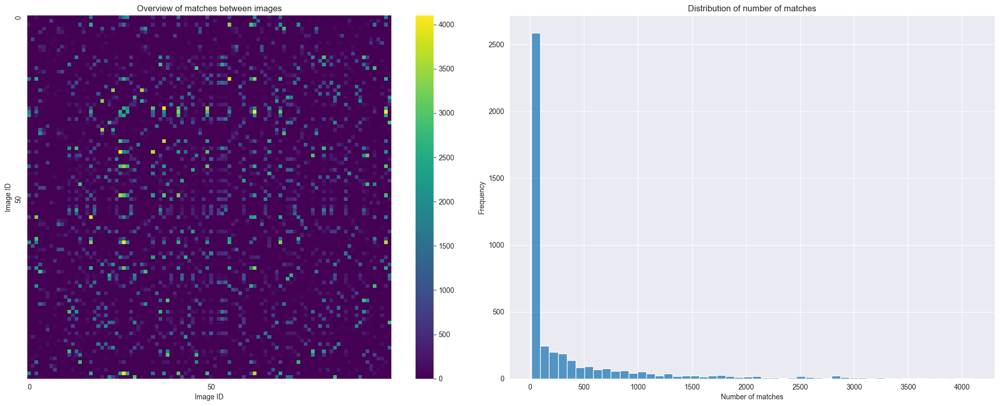

In [88]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Get the number of images
n_images = len(images)

# Create a matrix to store number of matches between images
match_matrix = np.zeros((n_images, n_images))

# Fill the matrix with number of matches
for (id1, id2), match_data in matches.items():
    if match_data is not None:
        idx1 = int(id1) - 1
        idx2 = int(id2) - 1
        if 0 <= idx1 < n_images and 0 <= idx2 < n_images:
            n_matches = len(match_data)
            match_matrix[idx1, idx2] = n_matches
            match_matrix[idx2, idx1] = n_matches

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# 1. Heatmap without annotations for overview
sns.heatmap(match_matrix, 
            cmap='viridis',
            square=True,
            xticklabels=50,  # Show every 50th label
            yticklabels=50,
            ax=ax1)
ax1.set_title('Overview of matches between images')
ax1.set_xlabel('Image ID')
ax1.set_ylabel('Image ID')

# 2. Distribution of number of matches
match_counts = match_matrix[match_matrix > 0]  # Get non-zero matches
sns.histplot(match_counts, bins=50, ax=ax2)
ax2.set_title('Distribution of number of matches')
ax2.set_xlabel('Number of matches')
ax2.set_ylabel('Frequency')

plt.tight_layout()

# Print statistics
print("\nMatch Statistics:")
print(f"Total images: {n_images}")
print(f"Total image pairs with matches: {len(matches)}")
print(f"Average matches per pair: {match_matrix.sum()/(2*len(matches)):.1f}")
print(f"Min matches: {match_matrix[match_matrix > 0].min():.0f}")
print(f"Max matches: {match_matrix.max():.0f}")
print(f"Median matches: {np.median(match_matrix[match_matrix > 0]):.0f}")

## 2.5 Visualize the keypoints and matches between the two images used in lab 3 using Colmap, how it compares to the results from lab 3? (1.0)
#### <span style='color:Green'> You can use the GUI to get the keypoints and matches and then visualize it here, following the same style as in lab 3 to get comparable results. </span>

In [78]:
### TO DO 2.5


## 2.6 Triangulate and visualize the 3D points from the keypoints extracted using Colmap on the two images used in lab 3, how it compares to the results from lab 3? (1.0) 
#### <span style='color:Green'> - Use the triangulation from lab 3 to the get the 3D points and visualize them following the same style. </span>

In [79]:
### TO DO 2.6

## 2.7 Visualize the sparse reconstruction using the 2 images from lab 3, and the complete CASTLE dataset. Comment on the differences between techniques and number of images used. (1.0)
#### <span style='color:Green'> - Use the reconstruction from Colmap to the get the 3D points and visualize them following the same style, using two images and the complete dataset. </span>

In [80]:
### TO DO 2.7